In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder  
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay, accuracy_score
from imblearn.over_sampling import SMOTE

In [2]:
df = pd.read_csv("D:/ml/WA_Fn-UseC_-HR-Employee-Attrition.csv")  
df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

In [4]:
df.describe()

,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1470.000000,1470.000000,1470.000000,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,...,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
mean,36.923810,802.485714,9.192517,2.912925,1.0,1024.865306,2.721769,65.891156,2.729932,2.063946,...,2.712245,80.0,0.793878,11.279592,2.799320,2.761224,7.008163,4.229252,2.187755,4.123129
std,9.135373,403.509100,8.106864,1.024165,0.0,602.024335,1.093082,20.329428,0.711561,1.106940,...,1.081209,0.0,0.852077,7.780782,1.289271,0.706476,6.126525,3.623137,3.222430,3.568136
min,18.000000,102.000000,1.000000,1.000000,1.0,1.000000,1.000000,30.000000,1.000000,1.000000,...,1.000000,80.0,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,465.000000,2.000000,2.000000,1.0,491.250000,2.000000,48.000000,2.000000,1.000000,...,2.000000,80.0,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,36.000000,802.000000,7.000000,3.000000,1.0,1020.500000,3.000000,66.000000,3.000000,2.000000,...,3.000000,80.0,1.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000
75%,43.000000,1157.000000,14.000000,4.000000,1.0,1555.750000,4.000000,83.750000,3.000000,3.000000,...,4.000000,80.0,1.000000,15.000000,3.000000,3.000000,9.000000,7.000000,3.000000,7.000000
max,60.000000,1499.000000,29.000000,5.000000,1.0,2068.000000,4.000000,100.000000,4.000000,5.000000,...,4.000000,80.0,3.000000,40.000000,6.000000,4.000000,40.000000,18.000000,15.000000,17.000000


In [5]:
for column in df.columns:
    print(f"{column}: Number of unique values {df[column].nunique()}")
    print("--------------------------------------------------------------------------------")

Age: Number of unique values 43
--------------------------------------------------------------------------------
Attrition: Number of unique values 2
--------------------------------------------------------------------------------
BusinessTravel: Number of unique values 3
--------------------------------------------------------------------------------
DailyRate: Number of unique values 886
--------------------------------------------------------------------------------
Department: Number of unique values 3
--------------------------------------------------------------------------------
DistanceFromHome: Number of unique values 29
--------------------------------------------------------------------------------
Education: Number of unique values 5
--------------------------------------------------------------------------------
EducationField: Number of unique values 6
--------------------------------------------------------------------------------
EmployeeCount: Number of unique values 1

In [6]:
df['Attrition'].value_counts()

Attrition
No     1233
Yes     237
Name: count, dtype: int64

In [29]:
df.duplicated().sum()

0

In [7]:
df.isnull().sum()

Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeCount               0
EmployeeNumber              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
Over18                      0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StandardHours               0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSince

In [8]:
df.drop(['EmployeeCount', 'EmployeeNumber', 'Over18', 'StandardHours'], axis=1, inplace=True)

In [ ]:
X = df.drop('Attrition', axis=1)
y = df['Attrition'].map({'Yes': 1, 'No': 0})

categorical_cols = [col for col in X.columns if X[col].dtype == 'object']

# One-Hot Encode Categorical Columns
X = pd.get_dummies(X, columns=categorical_cols, drop_first=True)

# Identify numerical columns (after encoding)
numerical_cols = X.select_dtypes(include=np.number).columns.tolist()

# Scale Numerical Columns
scaler = StandardScaler()
X[numerical_cols] = scaler.fit_transform(X[numerical_cols])

# Apply SMOTE
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X, y)



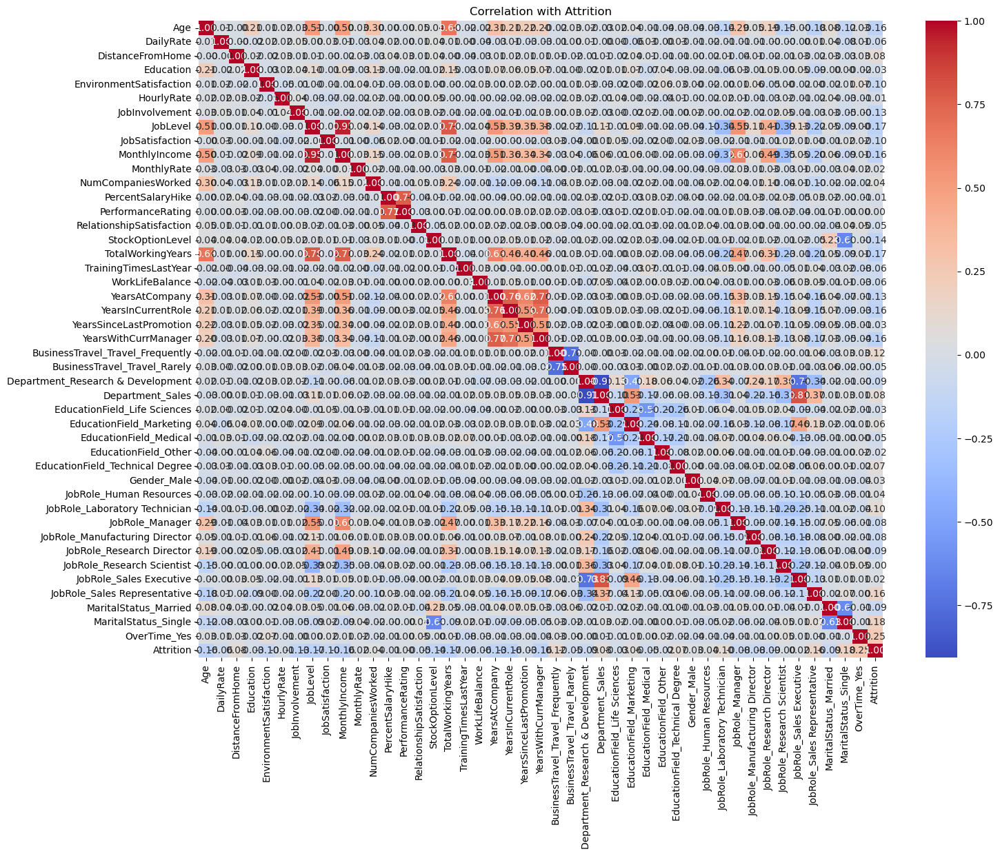

In [14]:
plt.figure(figsize=(16, 12))
# Calculate correlation between X features and y
correlations = pd.concat([X, pd.Series(y, name='Attrition')], axis=1).corr()
sns.heatmap(correlations, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation with Attrition')
plt.show()

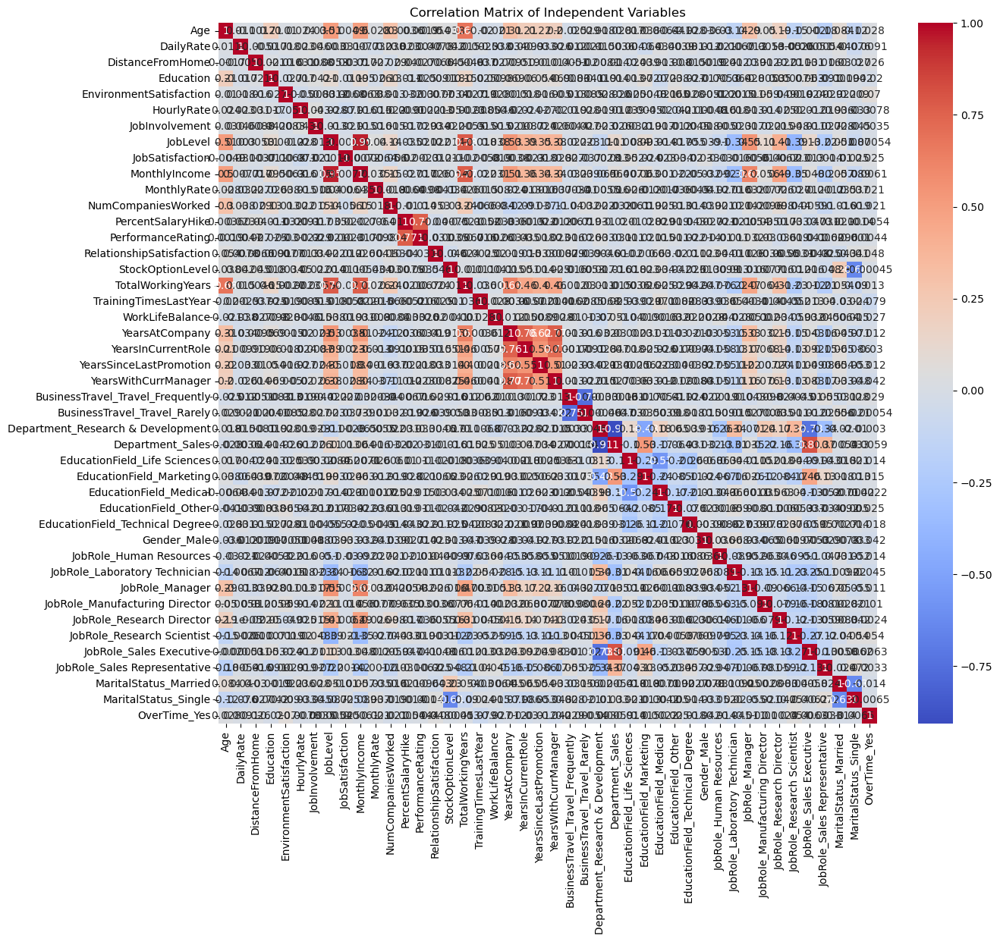

In [25]:
plt.figure(figsize=(14, 12))
sns.heatmap(X.corr(), annot=True, cmap='coolwarm')  # Or X_resampled.corr()
plt.title('Correlation Matrix of Independent Variables')
plt.show()

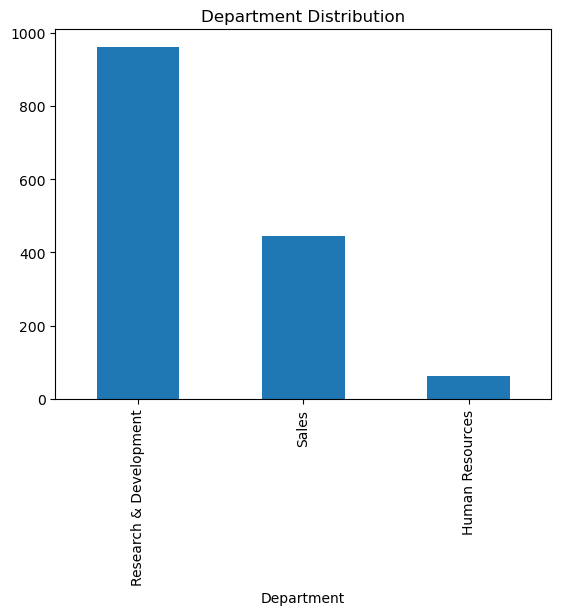

In [30]:
df['Department'].value_counts().plot(kind='bar')
plt.title('Department Distribution')
plt.show()

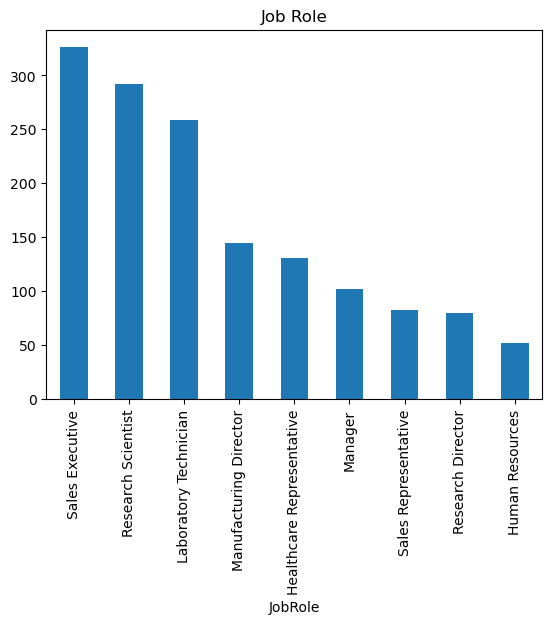

In [32]:
df['JobRole'].value_counts().plot(kind='bar')
plt.title('Job Role')
plt.show()

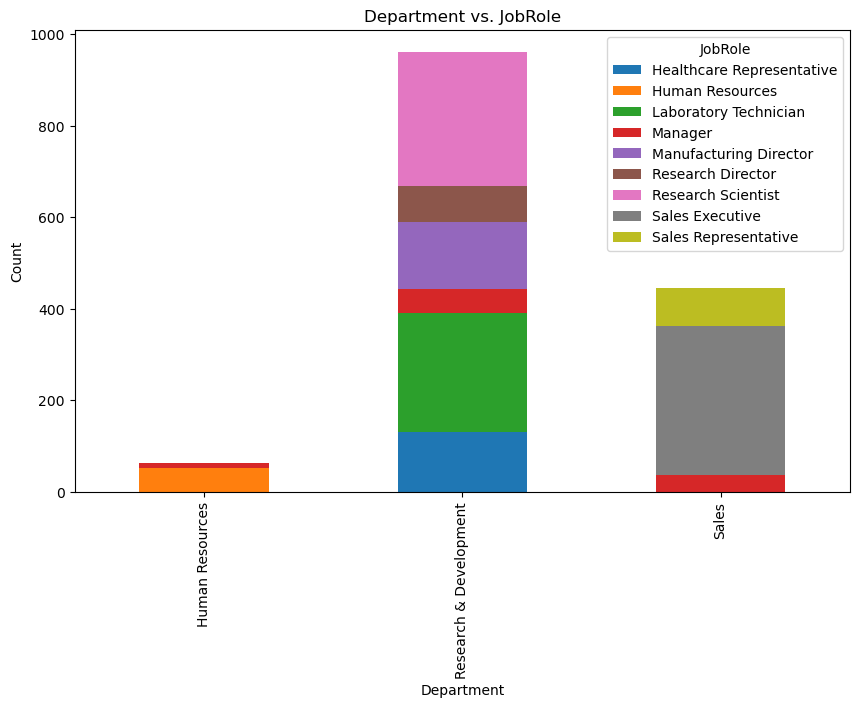

In [35]:
cross_tab = pd.crosstab(df['Department'], df['JobRole'])
cross_tab.plot(kind='bar', stacked=True, figsize=(10, 6))
plt.title('Department vs. JobRole')
plt.ylabel('Count')
plt.show()

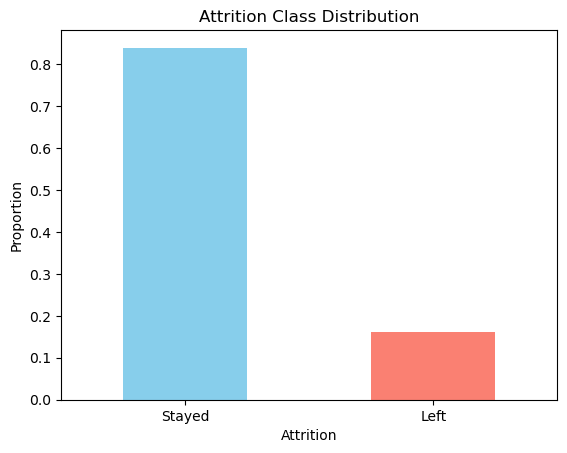

In [15]:
df['Attrition'].value_counts(normalize=True).plot(kind='bar', color=['skyblue', 'salmon'])
plt.title('Attrition Class Distribution')
plt.xticks(ticks=[0, 1], labels=['Stayed', 'Left'], rotation=0)
plt.ylabel('Proportion')
plt.show()

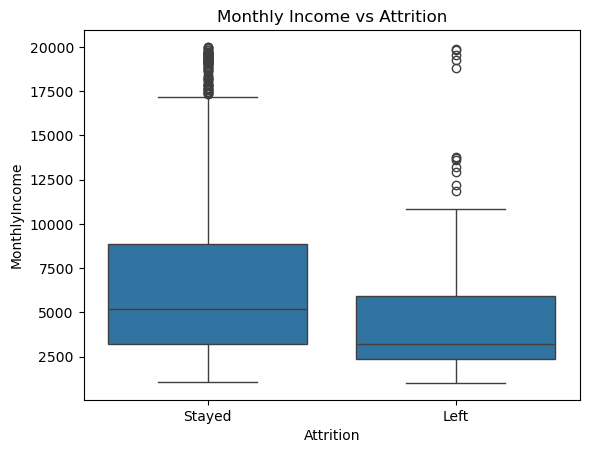

In [16]:
sns.boxplot(x=y, y='MonthlyIncome', data=df)
plt.title('Monthly Income vs Attrition')
plt.xticks([0,1], ['Stayed', 'Left'])
plt.show()


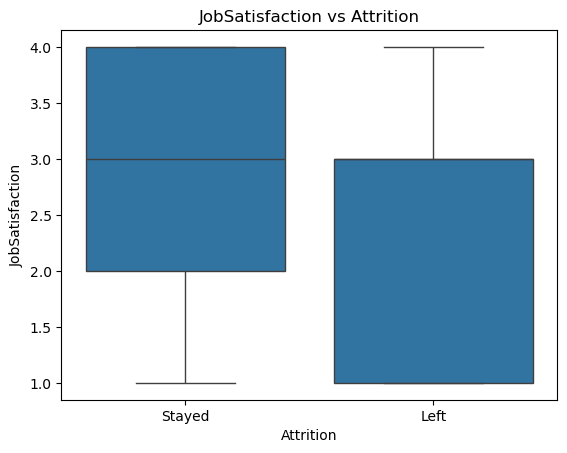

In [17]:
sns.boxplot(x=y, y='JobSatisfaction', data=df)
plt.title("JobSatisfaction vs Attrition")
plt.xticks([0, 1], ['Stayed', 'Left'])
plt.show()

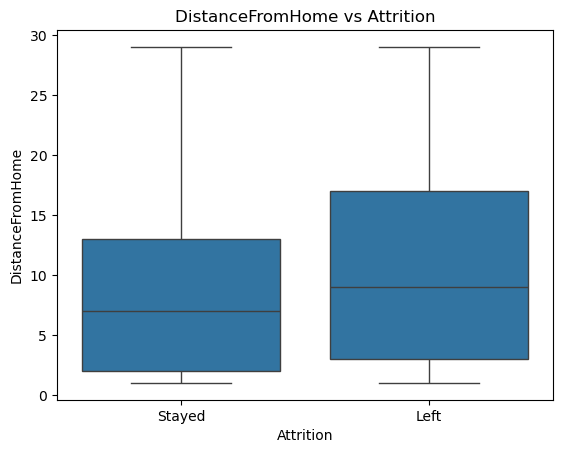

In [18]:
sns.boxplot(x=y, y='DistanceFromHome', data=df)
plt.title("DistanceFromHome vs Attrition")
plt.xticks([0, 1], ['Stayed', 'Left'])
plt.show()

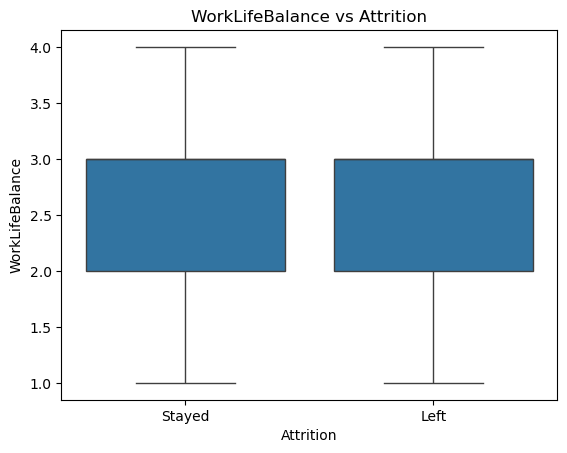

In [19]:
sns.boxplot(x=y, y='WorkLifeBalance', data=df)
plt.title("WorkLifeBalance vs Attrition")
plt.xticks([0, 1], ['Stayed', 'Left'])
plt.show()

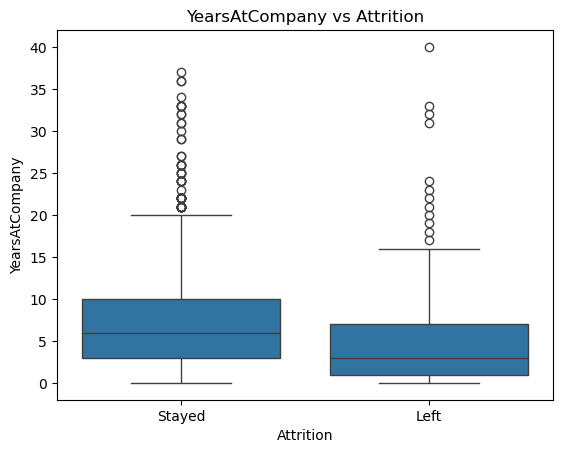

In [20]:
sns.boxplot(x=y, y='YearsAtCompany', data=df)
plt.title("YearsAtCompany vs Attrition")
plt.xticks([0, 1], ['Stayed', 'Left'])
plt.show()

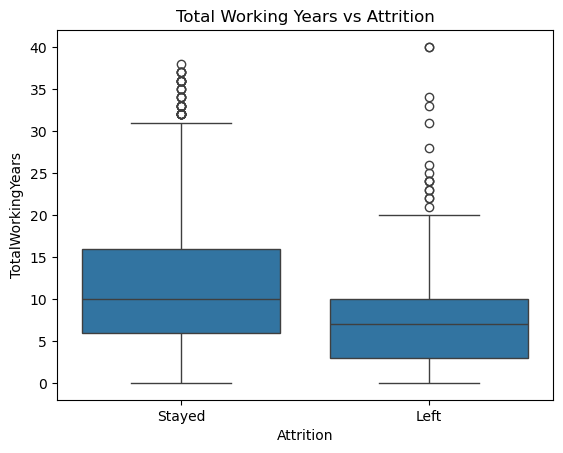

In [21]:
sns.boxplot(x=y, y='TotalWorkingYears', data=df)
plt.title("Total Working Years vs Attrition")
plt.xticks([0, 1], ['Stayed', 'Left'])
plt.show()

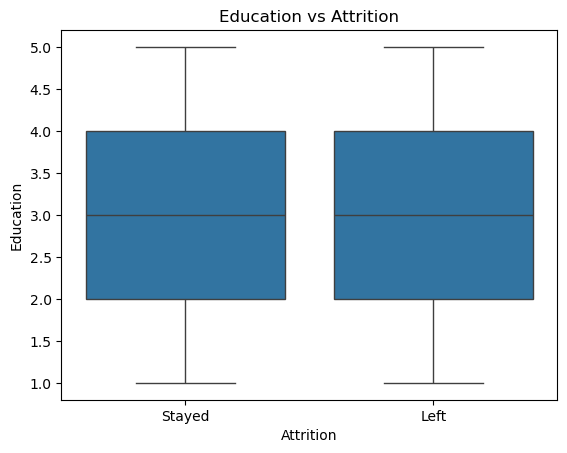

In [22]:
sns.boxplot(x=y, y='Education', data=df)
plt.title('Education vs Attrition')
plt.xticks([0,1], ['Stayed', 'Left'])
plt.show()

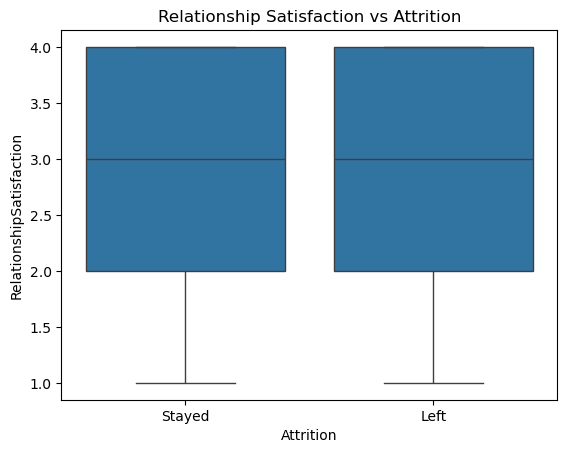

In [23]:
sns.boxplot(x=y, y='RelationshipSatisfaction', data=df)
plt.title('Relationship Satisfaction vs Attrition')
plt.xticks([0,1], ['Stayed', 'Left'])
plt.show()

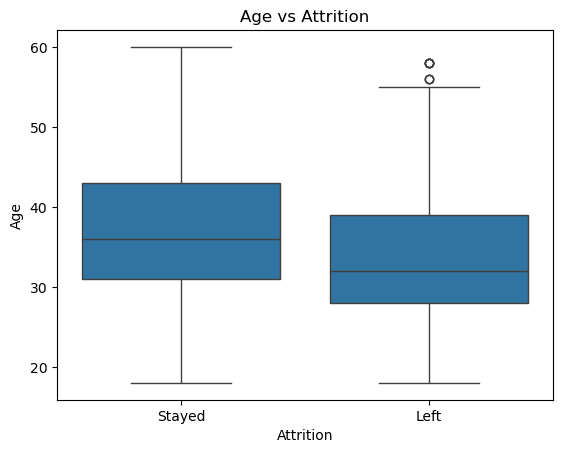

In [24]:
sns.boxplot(x=y, y='Age', data=df)
plt.title('Age vs Attrition')
plt.xticks([0,1], ['Stayed', 'Left'])
plt.show()

In [36]:
def remove_outliers(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1 
    lower_limit = Q1 - 1.5 * IQR
    upper_limit = Q3 + 1.5 * IQR
    return df[(df[column] >= lower_limit) & (df[column] <= upper_limit)]

df = remove_outliers(df, 'MonthlyIncome')
df = remove_outliers(df, 'YearsAtCompany')
df = remove_outliers(df, 'TotalWorkingYears')

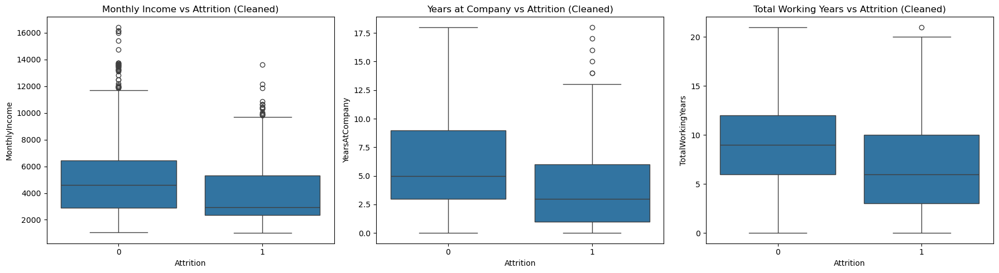

In [37]:
plt.figure(figsize=(18,5))

plt.subplot(1, 3, 1)
sns.boxplot(x=y, y='MonthlyIncome', data=df)
plt.title('Monthly Income vs Attrition (Cleaned)')

# 2. Years at Company vs Attrition
plt.subplot(1, 3, 2)
sns.boxplot(x=y, y='YearsAtCompany', data=df)
plt.title('Years at Company vs Attrition (Cleaned)')

# 3. Total Working Years vs Attrition
plt.subplot(1, 3, 3)
sns.boxplot(x=y, y='TotalWorkingYears', data=df)
plt.title('Total Working Years vs Attrition (Cleaned)')

plt.tight_layout()
plt.show()

In [38]:
Q1 = df['MonthlyIncome'].quantile(0.25)
Q3 = df['MonthlyIncome'].quantile(0.75)
IQR = Q3 - Q1
lower = Q1 - 1.0 * IQR
upper = Q3 + 1.0 * IQR

df = df[(df['MonthlyIncome'] >= lower) & (df['MonthlyIncome'] <= upper)]

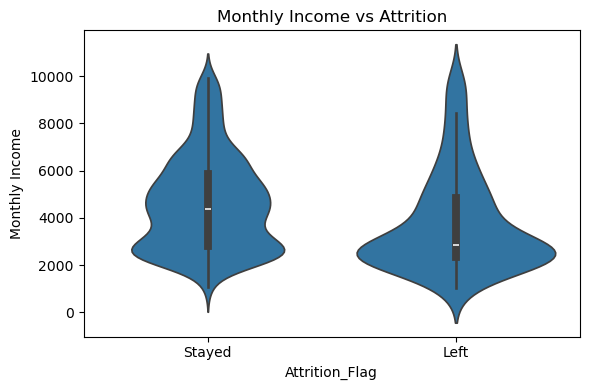

In [39]:
plt.figure(figsize=(6, 4))
sns.violinplot(x=y, y='MonthlyIncome', data=df, inner='box')
plt.title('Monthly Income vs Attrition')
plt.xlabel('Attrition_Flag')
plt.ylabel('Monthly Income')
plt.xticks([0, 1], ['Stayed', 'Left'])
plt.tight_layout()
plt.show()

In [42]:
X_train, X_test, y_train, y_test = train_test_split(
    X_resampled, y_resampled, test_size=0.2, 
    stratify=y_resampled, random_state=42
)


In [ ]:
from sklearn.linear_model import LogisticRegression

lr = LogisticRegression(max_iter=1000, random_state=42)
lr.fit(X_train, y_train)

y_preds = lr.predict(X_test)

print("Logistic Regression Performance:")
print("Accuracy:", accuracy_score(y_test, y_preds))
print("\nClassification Report:")
print(classification_report(y_test, y_preds, target_names=["Stayed", "Left"]))

Logistic Regression Performance:
Accuracy: 0.8967611336032388

Classification Report:
              precision    recall  f1-score   support

      Stayed       0.88      0.92      0.90       247
        Left       0.92      0.87      0.89       247

    accuracy                           0.90       494
   macro avg       0.90      0.90      0.90       494
weighted avg       0.90      0.90      0.90       494



"Using class balancing and logistic regression, the model achieved nearly 90% balanced accuracy across both classes."

In [61]:
from sklearn.ensemble import RandomForestClassifier

rfc = RandomForestClassifier(random_state=42)
rfc.fit(X_train, y_train)

rf_preds = rfc.predict(X_test)

print("Random Forest Performance:")
print("Accuracy:", accuracy_score(y_test, rf_preds))
print("\nClassification Report:")
print(classification_report(y_test, rf_preds, target_names=["Stayed", "Left"]))

Random Forest Performance:
Accuracy: 0.9230769230769231

Classification Report:
              precision    recall  f1-score   support

      Stayed       0.91      0.94      0.92       247
        Left       0.94      0.91      0.92       247

    accuracy                           0.92       494
   macro avg       0.92      0.92      0.92       494
weighted avg       0.92      0.92      0.92       494



In [62]:
from sklearn.model_selection import GridSearchCV

params_grid = {
    'n_estimators' : [100,200],
    'max_depth' : [5, 10, None],
    'min_samples_split' : [2,5],
    'class_weight' : [None, 'balanced']
}

In [63]:
grid_rf = GridSearchCV(
    estimator = RandomForestClassifier(random_state=42),
    param_grid= params_grid,
    cv = 5,
    scoring = 'recall',
    n_jobs = 1,
    verbose = 1
)

In [64]:
grid_rf.fit(X_train, y_train)

best_rf = grid_rf.best_estimator_
print("Best Estimator:", grid_rf.best_params_)

rf_preds = best_rf.predict(X_test)

print("Tuned Random Forest Performance:")
print("Accuracy:", accuracy_score(y_test, rf_preds))
print("\nClassification Report:")
print(classification_report(y_test, rf_preds, target_names=["Stayed", "Left"]))

Fitting 5 folds for each of 24 candidates, totalling 120 fits
Best Estimator: {'class_weight': 'balanced', 'max_depth': None, 'min_samples_split': 2, 'n_estimators': 200}
Tuned Random Forest Performance:
Accuracy: 0.9230769230769231

Classification Report:
              precision    recall  f1-score   support

      Stayed       0.91      0.94      0.92       247
        Left       0.94      0.90      0.92       247

    accuracy                           0.92       494
   macro avg       0.92      0.92      0.92       494
weighted avg       0.92      0.92      0.92       494



In [ ]:
from xgboost import XGBClassifier

xgb = XGBClassifier()

param_grid = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 6, 10],
    'min_child_weight': [1, 5, 10],
    'subsample': [0.6, 0.8, 1.0],
    'colsample_bytree': [0.6, 0.8, 1.0],
    'scale_pos_weight': [1, 2, 5],
    'gamma': [0, 0.1, 0.2],
}

grid_search = GridSearchCV(
    estimator=xgb,
    param_grid=param_grid,
    scoring='f1',
    cv=3,
    verbose=1,
    n_jobs=1
) 


In [66]:
grid_search.fit(X_train, y_train)

print("Best Hyperparameters found: ", grid_search.best_params_)

best_model = grid_search.best_estimator_

y_pred = best_model.predict(X_test)
print(f"Accuracy: {accuracy_score(y_test, y_pred)}")
print("Classification Report:")
print(classification_report(y_test, y_pred,  target_names=["Stayed", "Left"]))

Fitting 3 folds for each of 6561 candidates, totalling 19683 fits


c:\Users\user\anaconda3\Lib\site-packages\xgboost\core.py:158: UserWarning: [17:11:12] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0c55ff5f71b100e98-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\user\anaconda3\Lib\site-packages\xgboost\core.py:158: UserWarning: [17:11:12] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0c55ff5f71b100e98-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\user\anaconda3\Lib\site-packages\xgboost\core.py:158: UserWarning: [17:11:12] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0c55ff5f71b100e98-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\user\anaconda3\Lib\site-packages\xgbo

Best Hyperparameters found:  {'colsample_bytree': 0.6, 'gamma': 0, 'learning_rate': 0.1, 'max_depth': 6, 'min_child_weight': 1, 'n_estimators': 300, 'scale_pos_weight': 1, 'subsample': 0.6}
Accuracy: 0.9352226720647774
Classification Report:
              precision    recall  f1-score   support

      Stayed       0.91      0.97      0.94       247
        Left       0.97      0.90      0.93       247

    accuracy                           0.94       494
   macro avg       0.94      0.94      0.94       494
weighted avg       0.94      0.94      0.94       494



In [68]:
xgb_tuned = XGBClassifier(
    colsample_bytree=0.6,
    gamma=0,
    learning_rate=0.1,
    max_depth=6,
    min_child_weight=1,
    n_estimators=300,
    scale_pos_weight=1,
    subsample=0.6,
    eval_metric='logloss',
    random_state=42
)

# Fit the model
xgb_tuned.fit(X_train, y_train)

# Make predictions
y_pred = xgb_tuned.predict(X_test)

# Classification report with custom labels
print(classification_report(y_test, y_pred, target_names=['Stayed', 'Left']))

              precision    recall  f1-score   support

      Stayed       0.91      0.97      0.94       247
        Left       0.97      0.90      0.93       247

    accuracy                           0.93       494
   macro avg       0.94      0.93      0.93       494
weighted avg       0.94      0.93      0.93       494



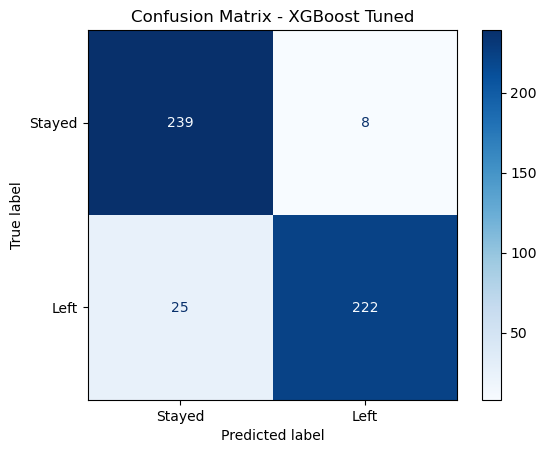

In [69]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

y_pred = xgb_tuned.predict(X_test)

cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["Stayed", "Left"])

disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix - XGBoost Tuned")
plt.show()